# Import libraries

In [1]:
%matplotlib inline
from importlib import reload
import utils; reload(utils)
from utils import *

Using cuDNN version 5105 on context None
Preallocating 2867/4095 Mb (0.700000) on cuda0
Mapped name None to device cuda0: GeForce GTX 650 (0000:01:00.0)
Using Theano backend.


In [2]:
%matplotlib inline

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import dicom
import os
import scipy.ndimage
import matplotlib.pyplot as plt
import datetime
import multiprocessing as mp
import pickle
from functools import reduce

from skimage import measure, morphology, color
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# Load vgg model

In [36]:
from vgg16bn import Vgg16BN
vgg100 = Vgg16BN((100,100)).model

/Users/rungsunan/anaconda/envs/py35/lib/python3.5/site-packages/keras/layers/core.py:577: UserWarning: `output_shape` argument not specified for layer lambda_1 and cannot be automatically inferred with the Theano backend. Defaulting to output shape `(None, 3, 100, 100)` (same as input shape). If the expected output shape is different, specify it via the `output_shape` argument.
  .format(self.name, input_shape))


In [37]:
vgg100.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_1 (Lambda)                (None, 3, 100, 100)   0           lambda_input_1[0][0]             
____________________________________________________________________________________________________
zeropadding2d_1 (ZeroPadding2D)  (None, 3, 102, 102)   0           lambda_1[0][0]                   
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 64, 100, 100)  1792        zeropadding2d_1[0][0]            
____________________________________________________________________________________________________
zeropadding2d_2 (ZeroPadding2D)  (None, 64, 102, 102)  0           convolution2d_1[0][0]            
___________________________________________________________________________________________

In [38]:
vgg100.compile(optimizer=Adam(1e-3),
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

In [39]:
conv_layers,fc_layers = split_at(vgg100, Convolution2D)

In [40]:
conv_model = Sequential(conv_layers)

# FC model

In [41]:
nf=512; p=0.6

In [42]:
def get_fc_layers():
    return [
        MaxPooling2D(input_shape=conv_layers[-1].output_shape[1:]),
        BatchNormalization(axis=1),
        Dropout(p/4.),
        Flatten(),
        Dense(nf, activation='relu'),
        BatchNormalization(),
        Dropout(p),
        Dense(nf, activation='relu'),
        BatchNormalization(),
        Dropout(p/2.),
        Dense(2, activation='softmax'),
    ]


In [43]:
lrg_model = Sequential(get_fc_layers())

In [44]:
lrg_model.input_shape, lrg_model.output_shape

((None, 512, 6, 6), (None, 2))

In [45]:
lrg_model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
maxpooling2d_6 (MaxPooling2D)    (None, 512, 3, 3)     0           maxpooling2d_input_1[0][0]       
____________________________________________________________________________________________________
batchnormalization_1 (BatchNorma (None, 512, 3, 3)     2048        maxpooling2d_6[0][0]             
____________________________________________________________________________________________________
dropout_1 (Dropout)              (None, 512, 3, 3)     0           batchnormalization_1[0][0]       
____________________________________________________________________________________________________
flatten_1 (Flatten)              (None, 4608)          0           dropout_1[0][0]                  
___________________________________________________________________________________________

In [46]:
lrg_model.compile(Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [47]:
weights_dir = '/Volumes/Backups/data/LUNA16/weights'

In [48]:
lrg_model.load_weights(weights_dir + 'vgg100x100-fc-2layer-nd512-p0d6-samplesize=16351-val_acc=0d9379.h5')

# Set constants

In [123]:
data_path = '/Volumes/Backups/data/kaggle2017/labeledcolorclass1/'

In [124]:
!ls -lh /Volumes/Backups/data/kaggle2017/labeledcolorclass1/

total 0
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:40 0015ceb851d7251b8f399e39779d1e7d
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:41 006b96310a37b36cccb2ab48d10b49a3
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:41 008464bb8521d09a42985dd8add3d0d2
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:41 00edff4f51a893d80dae2d42a7f45ad1
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:42 0257df465d9e4150adef13303433ff1e
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:43 02801e3bbcc6966cb115a962012c35df
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:43 028996723faa7840bb57f57e28275e4c
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:44 04a8c47583142181728056310759dea1
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:44 05609fdb8fa0895ac8a9be373144dac7
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:44 059d8c14b2256a2ba4e38ac511700203
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:44 064366faa1a83fdcb18b2538f1717290
drwxr-xr-x  3 rungsunan  staff   102B Apr  8 03:45 0708c00f6117ed977

# Read in data

In [128]:
patient_names = os.listdir(data_path)[:10]
print(patient_names[9])

059d8c14b2256a2ba4e38ac511700203


In [126]:
for patient_name in patient_names:
#     patient_name = patient_name + '/'
    print(data_path + patient_name)
    patient_path = os.listdir(data_path + patient_name + '/')
    print(patient_path)
    image3d = load_array(data_path + patient_name + '/' + patient_path[0])
    print(image3d.shape)
    
    pred10x10 = np.zeros(shape=(nPatches,nPatches,image3d.shape[0], 2), dtype=np.float32)
    j=0
    for y in range(nPatches):
        i=0
        for x in range(nPatches):
            y0 = y*dxy
            y1 = y*dxy+100
            x0 = x*dxy
            x1 = x*dxy+100
#             print((x0,x1,y0,y1))
            patch = image3d[:,:, y0:y1, x0:x1]
            # patch.shape
            %time conv_ftrs = conv_model.predict(patch)
            pred = lrg_model.predict(conv_ftrs)
#             print(pred.shape)
            pred10x10[j,i,:,:] = pred
            i+=1
        j+=1
    save_array('/Volumes/Backups/data/kaggle2017/predictions/10x10/labeledcolorclass1/' + patient_name, pred10x10)

/Volumes/Backups/data/kaggle2017/labeledcolorclass1/0015ceb851d7251b8f399e39779d1e7d
['0015ceb851d7251b8f399e39779d1e7d_195x3x512x512.bc']
(195, 3, 512, 512)
CPU times: user 3.87 s, sys: 69.4 ms, total: 3.94 s
Wall time: 4.6 s
CPU times: user 3.99 s, sys: 62.5 ms, total: 4.05 s
Wall time: 4.57 s
CPU times: user 3.63 s, sys: 70.2 ms, total: 3.7 s
Wall time: 4.57 s
CPU times: user 3.77 s, sys: 63.8 ms, total: 3.83 s
Wall time: 4.58 s
CPU times: user 4.04 s, sys: 49.7 ms, total: 4.09 s
Wall time: 4.55 s
CPU times: user 3.93 s, sys: 68.4 ms, total: 4 s
Wall time: 4.56 s
CPU times: user 3.69 s, sys: 65.5 ms, total: 3.76 s
Wall time: 4.56 s
CPU times: user 4.11 s, sys: 60.2 ms, total: 4.17 s
Wall time: 4.56 s
CPU times: user 4.36 s, sys: 41.5 ms, total: 4.4 s
Wall time: 4.55 s
CPU times: user 4.15 s, sys: 57.3 ms, total: 4.21 s
Wall time: 4.54 s
CPU times: user 4.47 s, sys: 28.1 ms, total: 4.5 s
Wall time: 4.55 s
CPU times: user 4.22 s, sys: 54.7 ms, total: 4.27 s
Wall time: 4.55 s
CPU times

/Volumes/Backups/data/kaggle2017/labeledcolorclass1/437e42695e7ad0a1cb834e1b3e780516
['437e42695e7ad0a1cb834e1b3e780516_149x3x512x512.bc']
(149, 3, 512, 512)
CPU times: user 3.4 s, sys: 18.7 ms, total: 3.42 s
Wall time: 3.43 s
CPU times: user 3.4 s, sys: 12.7 ms, total: 3.42 s
Wall time: 3.42 s
CPU times: user 3.36 s, sys: 32.3 ms, total: 3.4 s
Wall time: 3.41 s
CPU times: user 3.38 s, sys: 17.5 ms, total: 3.4 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 11.2 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 11 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 11.2 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.41 s, sys: 10.8 ms, total: 3.42 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.8 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.9 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.38 s, sys: 11.8 ms, total: 3.4 s
Wall time: 3.41 s
CPU times: user 3.39 s, sys: 12.3 ms, total: 3.4 s
Wall time: 3.42 s
CPU times: user

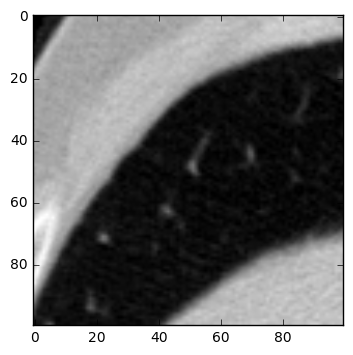

(1, 2, 53)


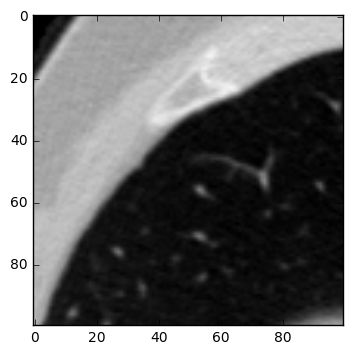

(1, 2, 54)


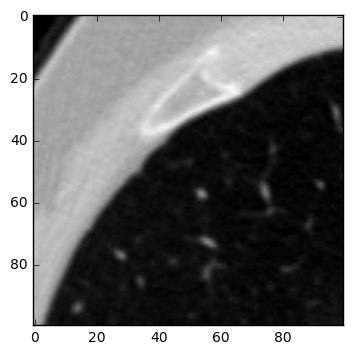

(1, 2, 55)


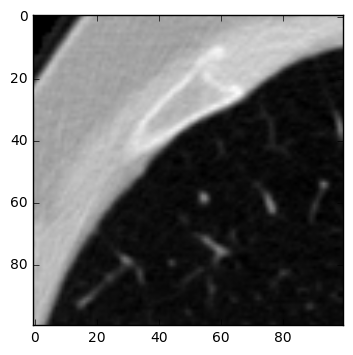

(1, 2, 56)


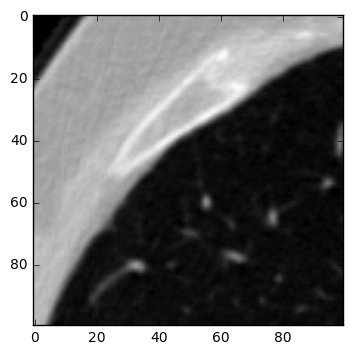

(1, 2, 57)


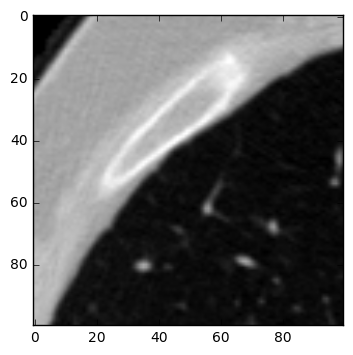

(1, 2, 58)


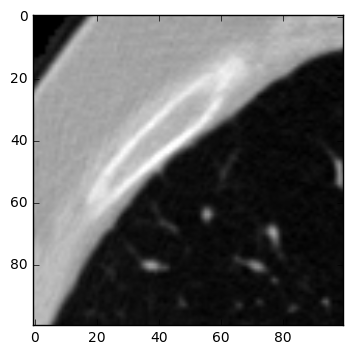

(1, 2, 59)


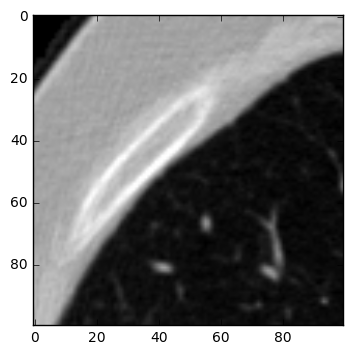

(1, 2, 60)


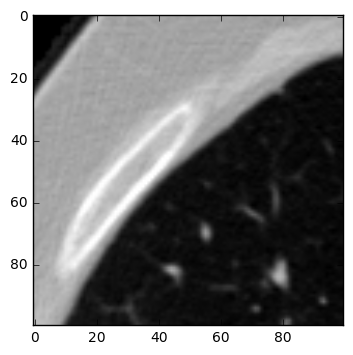

(1, 2, 62)


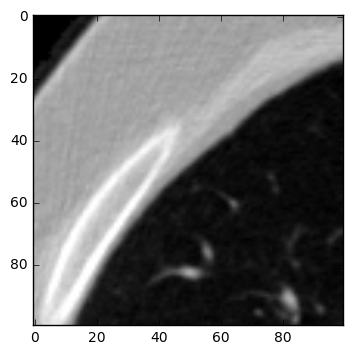

(1, 2, 63)


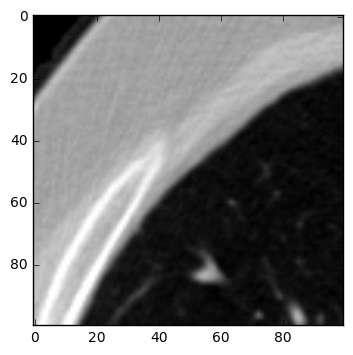

(1, 2, 64)


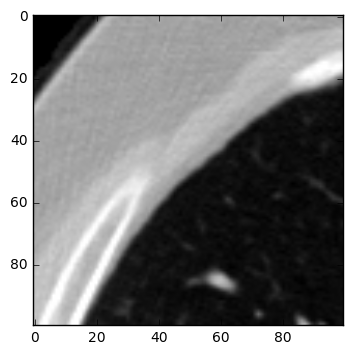

(1, 2, 65)


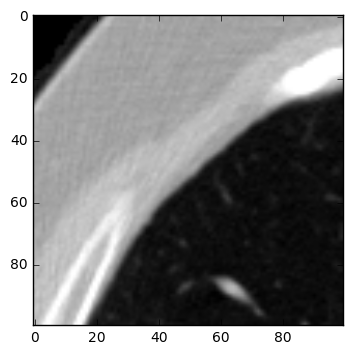

(1, 2, 66)


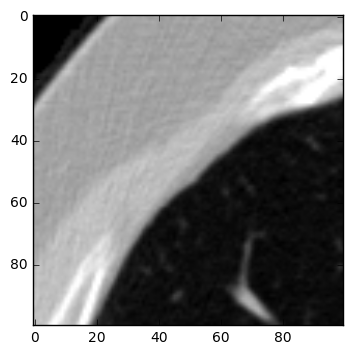

(1, 2, 67)


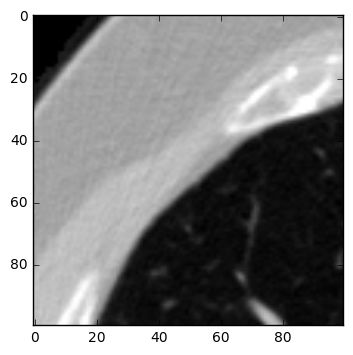

(1, 2, 68)


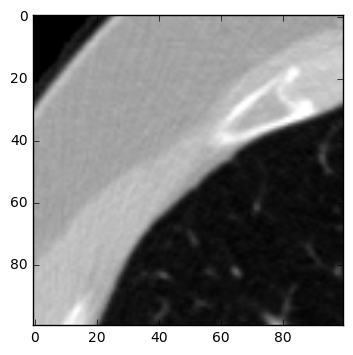

(1, 2, 69)


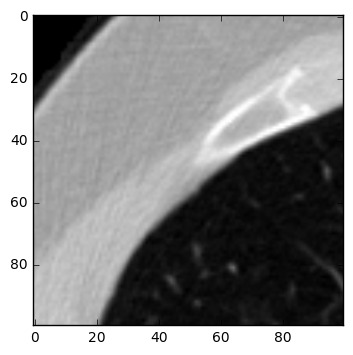

(1, 2, 70)


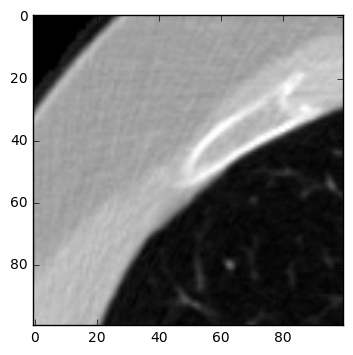

(1, 2, 71)


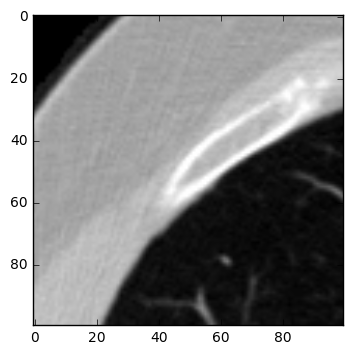

(1, 2, 72)


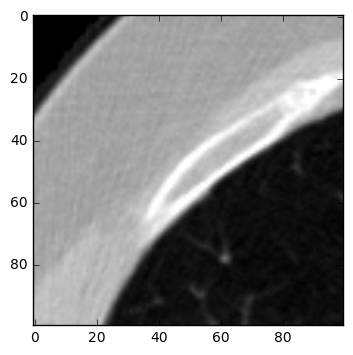

(1, 2, 73)


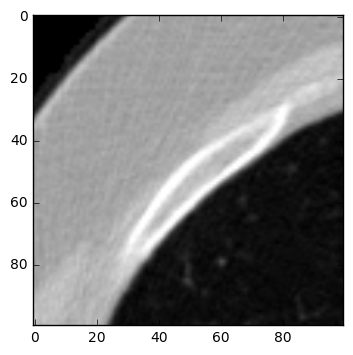

(1, 2, 74)


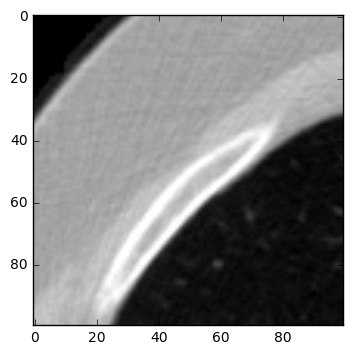

(1, 2, 75)


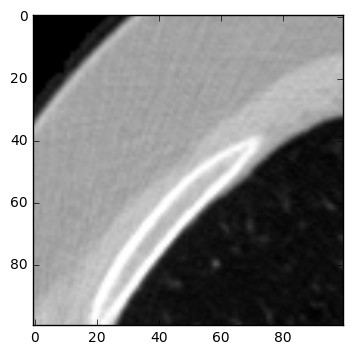

(1, 2, 76)


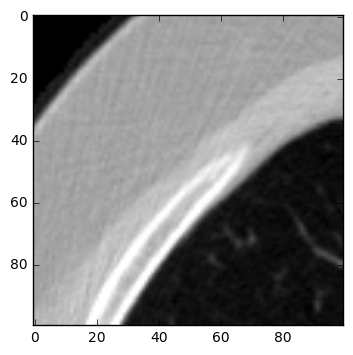

(1, 2, 77)


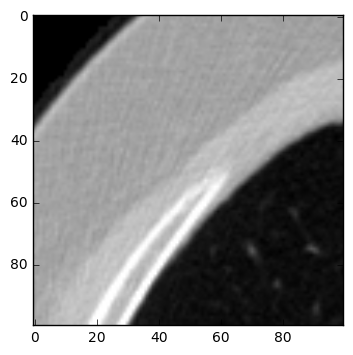

CPU times: user 3.4 s, sys: 19.3 ms, total: 3.42 s
Wall time: 3.42 s
(2, 2, 91)


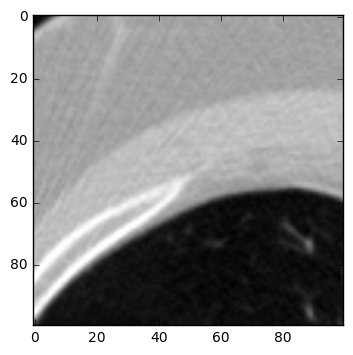

CPU times: user 3.4 s, sys: 13.1 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 12.2 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 9.82 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
(7, 2, 14)


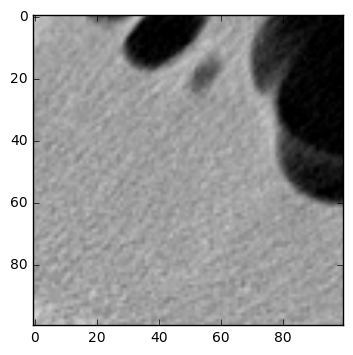

CPU times: user 3.4 s, sys: 12.5 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 11 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 10.9 ms, total: 3.4 s
Wall time: 3.41 s
(0, 3, 63)


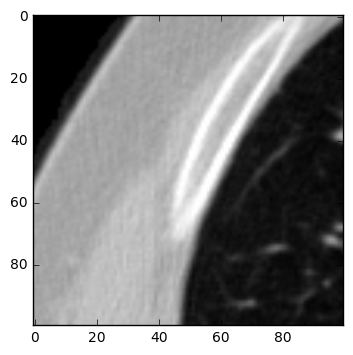

CPU times: user 3.39 s, sys: 12.6 ms, total: 3.41 s
Wall time: 3.41 s
(1, 3, 96)


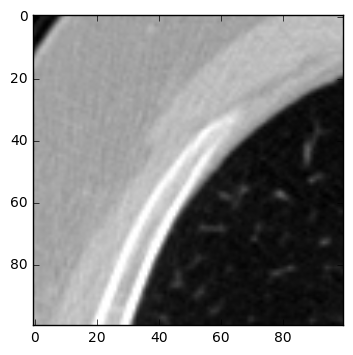

(1, 3, 97)


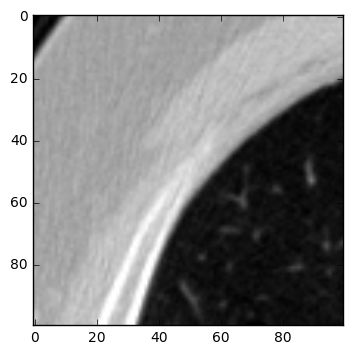

(1, 3, 98)


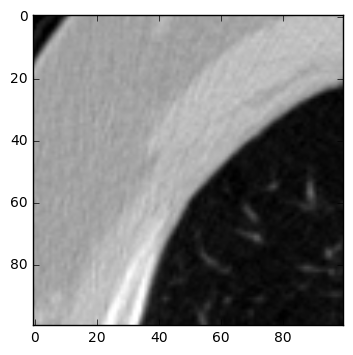

(1, 3, 99)


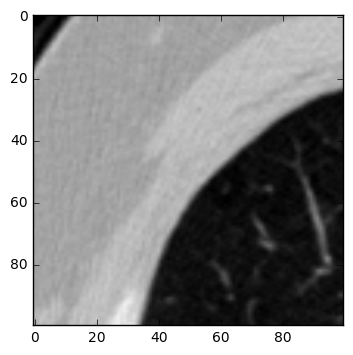

CPU times: user 3.4 s, sys: 12.6 ms, total: 3.41 s
Wall time: 3.41 s
(2, 3, 14)


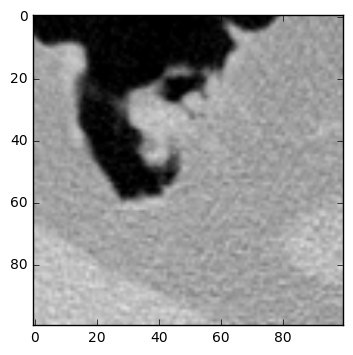

(2, 3, 15)


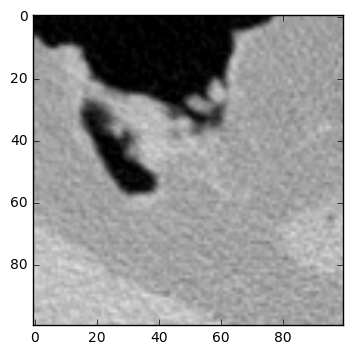

(2, 3, 18)


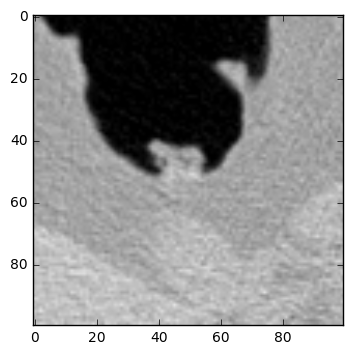

(2, 3, 19)


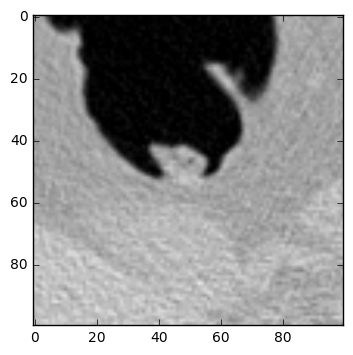

CPU times: user 3.4 s, sys: 13.4 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 15.3 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.35 s, sys: 41.7 ms, total: 3.39 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.5 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 12.1 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 11.1 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
(9, 3, 76)


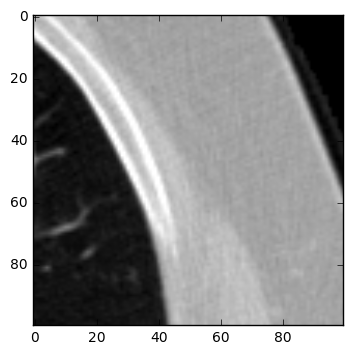

CPU times: user 3.4 s, sys: 12.5 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.3 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.41 s, sys: 9.73 ms, total: 3.42 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.1 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.6 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.39 s, sys: 10.5 ms, total: 3.4 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.6 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.1 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.2 ms, total: 3.42 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 12.1 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 11.4 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 11.

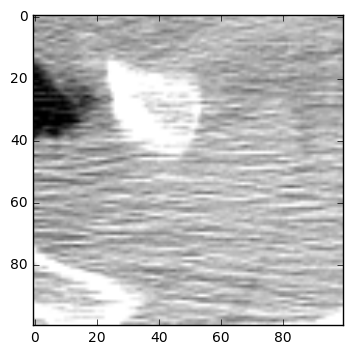

CPU times: user 3.4 s, sys: 12.5 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.37 s, sys: 22.2 ms, total: 3.4 s
Wall time: 3.41 s
CPU times: user 3.34 s, sys: 40.9 ms, total: 3.39 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 11.5 ms, total: 3.4 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 11.4 ms, total: 3.4 s
Wall time: 3.41 s
(2, 7, 122)


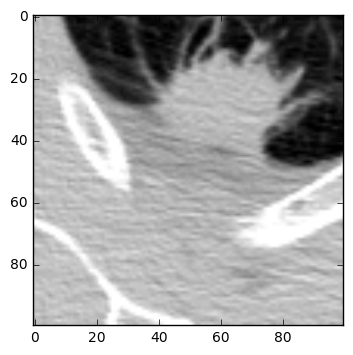

CPU times: user 3.39 s, sys: 14.2 ms, total: 3.41 s
Wall time: 3.42 s
(3, 7, 122)


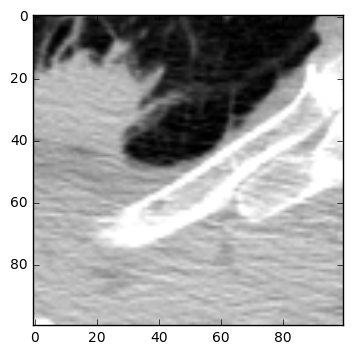

CPU times: user 3.4 s, sys: 13.4 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.41 s, sys: 9.57 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 11.6 ms, total: 3.4 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 10.5 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.8 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.9 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 12.5 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 12.8 ms, total: 3.4 s
Wall time: 3.42 s
CPU times: user 3.39 s, sys: 12 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.2 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
(4, 8, 96)


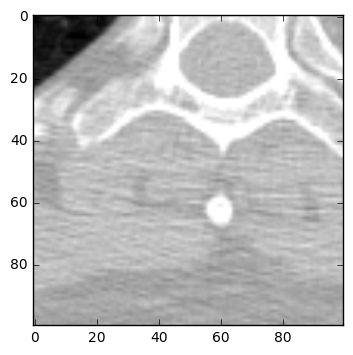

CPU times: user 3.4 s, sys: 13.6 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.39 s, sys: 10.7 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.6 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.39 s, sys: 11.1 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 9.98 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.39 s, sys: 12.9 ms, total: 3.4 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 9.82 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.4 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 11.5 ms, total: 3.41 s
Wall time: 3.42 s
CPU times: user 3.4 s, sys: 10.6 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10 ms, total: 3.41 s
Wall time: 3.41 s
CPU times: user 3.39 s, sys: 10.4 ms, total: 3.4 s
Wall time: 3.41 s
CPU times: user 3.4 s, sys: 10.4 ms,

In [147]:
# High probability patches
# for patient_name in patient_names[:1]:
for patient_name in ['437e42695e7ad0a1cb834e1b3e780516']:  # patient_names[:1]:
#     patient_name = patient_name + '/'
    print(data_path + patient_name)
    patient_path = os.listdir(data_path + patient_name + '/')
    print(patient_path)
    image3d = load_array(data_path + patient_name + '/' + patient_path[0])
    print(image3d.shape)
    
    pred10x10 = np.zeros(shape=(nPatches,nPatches,image3d.shape[0], 2), dtype=np.float32)
    j=0
    for y in range(nPatches):
        i=0
        for x in range(nPatches):
            y0 = y*dxy
            y1 = y*dxy+100
            x0 = x*dxy
            x1 = x*dxy+100
#             print((x0,x1,y0,y1))
            patch = image3d[:,:, y0:y1, x0:x1]
            # patch.shape
            %time conv_ftrs = conv_model.predict(patch)
            pred = lrg_model.predict(conv_ftrs)
            highProb = pred[:,1] > 0.95 # high prob of class 1
            for k, val in enumerate(highProb):
                if val:
                    print((i,j,k))
                    plt.imshow(np.transpose(patch[k], (1,2,0))/255, vmin=0, vmax=1)
                    plt.show()
#             print(pred.shape)
            pred10x10[j,i,:,:] = pred
            i+=1
        j+=1

In [131]:
print(data_path + patient_names[0])

/Volumes/Backups/data/kaggle2017/labeledcolorclass1/0015ceb851d7251b8f399e39779d1e7d


In [112]:
save_array('/Volumes/Backups/data/kaggle2017/predictions/10x10/labeledcolorclass0/' + patient_names[0], pred10x10)

In [103]:
pred10x10.shape

(10, 10, 265, 2)

In [ ]:
save_array

In [74]:
image3d.shape

(265, 3, 512, 512)

In [479]:
# i = 0
# # image3d_list = list()
# # for patient_name in (os.listdir(data_path)):

# def load_3d_image(patient_name):
#     patient_dir = data_path + patient_name + '/'
#     print (patient_dir)
        
#     def load_slice(i):
#         slice_name = (patient_dir + patient_name +'_'+ str(i) +'x512x512x3.bc')
# #         print(slice_name)
#         return np.transpose(color.gray2rgb(load_array(slice_name)), (2,0,1))

#     num_slices = len(os.listdir(patient_dir))
#     return np.stack(map(load_slice, range(num_slices))), patient_name # np.array
    
# %time image3d_lst = list(map(load_3d_image, ['437e42695e7ad0a1cb834e1b3e780516'])) #os.listdir(data_path)[0:2]))    
    
    
    
# #     i += 1
# #     if i > 0:
# #         break


/Volumes/Backups/data/kaggle2017/labeledcolorclass1/437e42695e7ad0a1cb834e1b3e780516/
CPU times: user 568 ms, sys: 614 ms, total: 1.18 s
Wall time: 1.14 s


In [484]:
image3d_lst[0][1]

'437e42695e7ad0a1cb834e1b3e780516'

In [481]:
plt.imshow(np.transpose(image3d_list[0][100], (1,2,0))/255)

IndexError: tuple index out of range

In [485]:
image3d = image3d_lst[0][0]

In [29]:
nSlice = 100

In [30]:
# Shift size in x and y directions
dxy = np.int32((image3d[0].shape[1]-100) / (np.ceil((image3d[0].shape[1]-100+1) / (100/2)))) # For 244: patches: 0-99, 48-147, 96-195, 144-243

In [71]:
nPatches = np.int32(np.ceil((image3d[0].shape[1]-100+1) / (100/2)) + 1)

In [72]:
nPatches, dxy

(10, 45)

In [33]:
ix=5; iy=3

In [34]:
slice2d = image3d[nSlice]

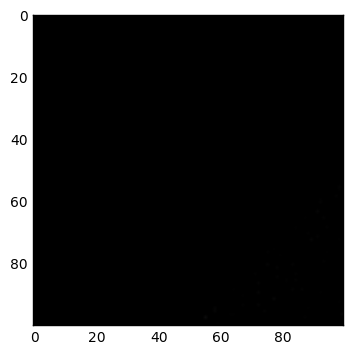

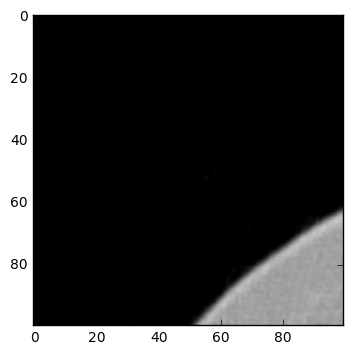

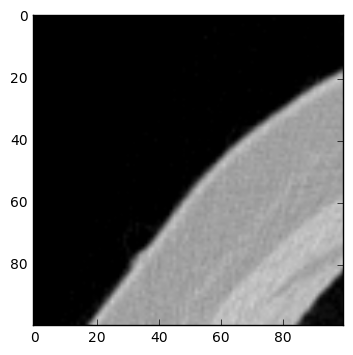

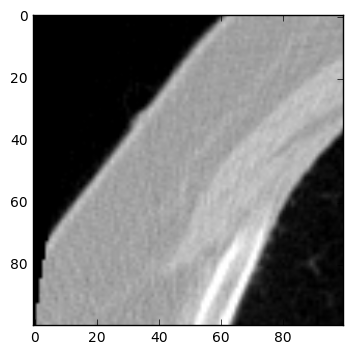

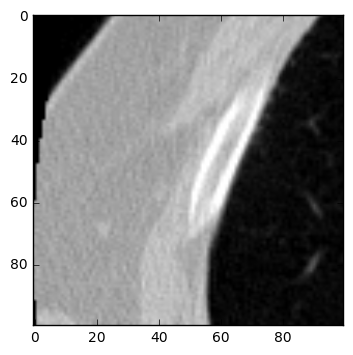

...

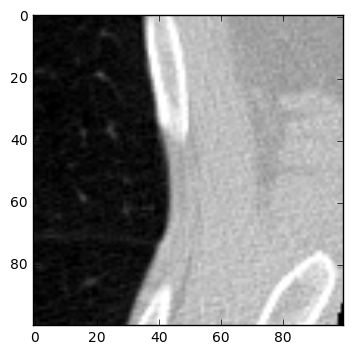

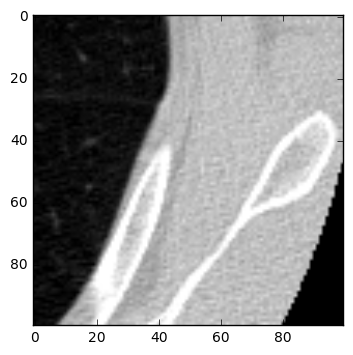

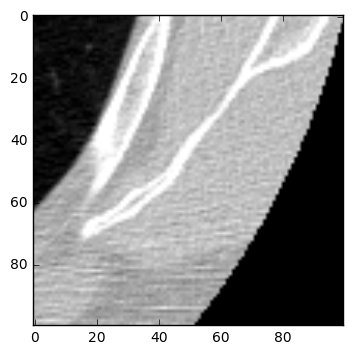

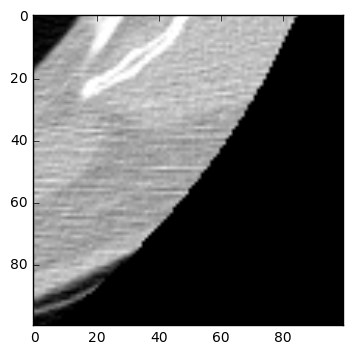

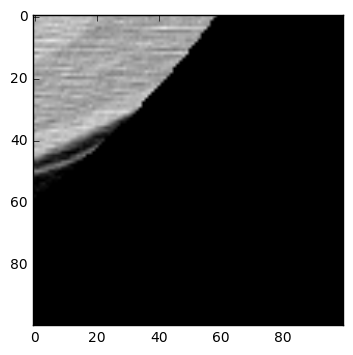

In [35]:
for ix in range(nPatches):
    for iy in range(nPatches):
        patch = slice2d[:, iy*dxy:iy*dxy+100, ix*dxy:ix*dxy+100]
        plt.imshow(np.transpose(patch, (1,2,0))/255)
        plt.show()

# Predict

In [49]:
slice2d = image3d[:]

In [50]:
slice2d.shape

(158, 3, 512, 512)

In [51]:
ix=0; iy=0 #ix=5; iy=3

In [54]:
ix=5; iy=3
y0 = iy*dxy
y1 = iy*dxy+100
x0 = ix*dxy
x1 = ix*dxy+100
print((x0,x1,y0,y1))
patch = slice2d[:,:, y0:y1, x0:x1]
# patch.shape
%time conv_ftrs = conv_model.predict(patch)
pred = lrg_model.predict(conv_ftrs)


(225, 325, 135, 235)
CPU times: user 3.61 s, sys: 17.2 ms, total: 3.63 s
Wall time: 3.63 s


In [55]:
pred.shape

(158, 2)

In [56]:
type(pred[1][1])

numpy.float32

In [57]:
pred.sum(axis=1)

array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
        1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.], dtype=float32)

In [ ]:
plt.hist(pred[:,1],range=(0,1))

In [385]:
# def fny(y):
#     def fnx(x):
#         y0 = y*dxy
#         y1 = y*dxy+100
#         x0 = x*dxy
#         x1 = x*dxy+100
#         print((x0,x1,y0,y1))
#         patch = slice2d[:,:, y0:y1, x0:x1]
#         # patch.shape
#         %time conv_ftrs = conv_model.predict(patch)
#         return lrg_model.predict(conv_ftrs)
# #         return predX
#     predY = np.stack(map(fnx, range(3,5)))
#     return predY
# %time pred10x10 = np.stack(map(fny, range(5,7)))

In [386]:
pred10x10.shape # (y,x,z,onehot)

(2, 2, 195, 2)

In [ ]:
plt.hist(pred[:,1].flatten(), range=(0,1))

In [289]:
pred.shape # (y,x,z,onehot)

(195, 2)

In [ ]:
plt.hist(pred[:,1].flatten(), range=(0,1))

In [ ]:
plt.hist(pred[0,0,:,1],range=(0,1))

In [230]:
pred.shape

(195, 512, 6, 6)

In [425]:
pred10x10for1 = np.zeros(shape=(nPatches,nPatches,195,2), dtype=np.float32)
j=0
for y in range(nPatches):
    i=0
    for x in range(nPatches):
        y0 = y*dxy
        y1 = y*dxy+100
        x0 = x*dxy
        x1 = x*dxy+100
        print((x0,x1,y0,y1))
        patch = slice2d[:,:, y0:y1, x0:x1]
        # patch.shape
        %time conv_ftrs = conv_model.predict(patch)
        pred = lrg_model.predict(conv_ftrs)
        print(pred.shape)
        pred10x10for1[j,i,:,:] = pred
        i+=1
    j+=1

(0, 100, 0, 100)
CPU times: user 4.04 s, sys: 280 ms, total: 4.32 s
Wall time: 4.54 s
(195, 2)
(45, 145, 0, 100)
CPU times: user 4.02 s, sys: 288 ms, total: 4.31 s
Wall time: 4.54 s
(195, 2)
(90, 190, 0, 100)
CPU times: user 4.1 s, sys: 248 ms, total: 4.35 s
Wall time: 4.54 s
(195, 2)
(135, 235, 0, 100)
CPU times: user 3.9 s, sys: 359 ms, total: 4.26 s
Wall time: 4.54 s
(195, 2)
(180, 280, 0, 100)
CPU times: user 4.38 s, sys: 91.3 ms, total: 4.47 s
Wall time: 4.54 s
(195, 2)
(225, 325, 0, 100)
CPU times: user 4.02 s, sys: 282 ms, total: 4.31 s
Wall time: 4.54 s
(195, 2)
(270, 370, 0, 100)
CPU times: user 4.03 s, sys: 284 ms, total: 4.31 s
Wall time: 4.54 s
(195, 2)
(315, 415, 0, 100)
CPU times: user 4.03 s, sys: 289 ms, total: 4.31 s
Wall time: 4.54 s
(195, 2)
(360, 460, 0, 100)
CPU times: user 4.05 s, sys: 271 ms, total: 4.33 s
Wall time: 4.54 s
(195, 2)
(405, 505, 0, 100)
CPU times: user 3.98 s, sys: 321 ms, total: 4.3 s
Wall time: 4.54 s
(195, 2)
(0, 100, 45, 145)
CPU times: user 4.

(array([ 8.6579,  0.4877,  0.2482,  0.1569,  0.12  ,  0.0933,  0.0764,  0.0544,  0.0544,  0.0508]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

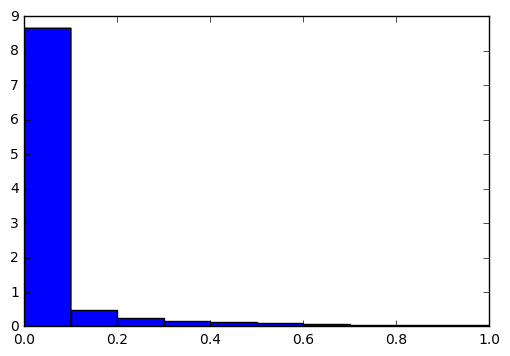

In [503]:
plt.hist(pred10x10for1[:,:,:,1].flatten(), range=(0,1), normed=True)

In [462]:
# predict for each patch of each slice
pred10x10for0 = np.zeros(shape=(nPatches,nPatches,265,2), dtype=np.float32)
j=0
for y in range(nPatches):
    i=0
    for x in range(nPatches):
        y0 = y*dxy
        y1 = y*dxy+100
        x0 = x*dxy
        x1 = x*dxy+100
        print((x0,x1,y0,y1))
        patch = slice2d[:,:, y0:y1, x0:x1]
        # patch.shape
        %time conv_ftrs = conv_model.predict(patch)
        pred = lrg_model.predict(conv_ftrs)
        print(pred.shape)
        pred10x10for0[j,i,:,:] = pred
        i+=1
    j+=1

(0, 100, 0, 100)
CPU times: user 5.44 s, sys: 418 ms, total: 5.86 s
Wall time: 6.17 s
(265, 2)
(45, 145, 0, 100)
CPU times: user 5.72 s, sys: 243 ms, total: 5.96 s
Wall time: 6.16 s
(265, 2)
(90, 190, 0, 100)
CPU times: user 5.49 s, sys: 374 ms, total: 5.86 s
Wall time: 6.17 s
(265, 2)
(135, 235, 0, 100)
CPU times: user 5.4 s, sys: 348 ms, total: 5.75 s
Wall time: 6.17 s
(265, 2)
(180, 280, 0, 100)
CPU times: user 5.57 s, sys: 311 ms, total: 5.88 s
Wall time: 6.17 s
(265, 2)
(225, 325, 0, 100)
CPU times: user 5.48 s, sys: 393 ms, total: 5.87 s
Wall time: 6.17 s
(265, 2)
(270, 370, 0, 100)
CPU times: user 5.71 s, sys: 249 ms, total: 5.96 s
Wall time: 6.17 s
(265, 2)
(315, 415, 0, 100)
CPU times: user 5.47 s, sys: 391 ms, total: 5.86 s
Wall time: 6.16 s
(265, 2)
(360, 460, 0, 100)
CPU times: user 5.48 s, sys: 386 ms, total: 5.86 s
Wall time: 6.16 s
(265, 2)
(405, 505, 0, 100)
CPU times: user 5.53 s, sys: 346 ms, total: 5.87 s
Wall time: 6.16 s
(265, 2)
(0, 100, 45, 145)
CPU times: user 5

(array([ 8.96  ,  0.4781,  0.2143,  0.1151,  0.0717,  0.0498,  0.0321,  0.0298,  0.0215,  0.0275]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

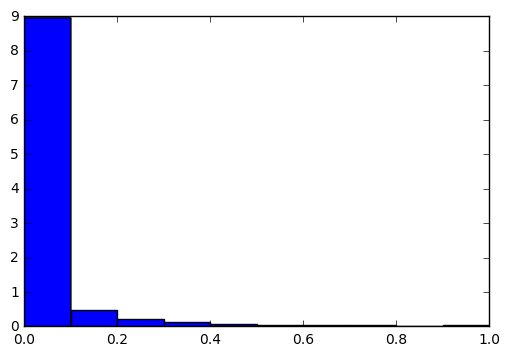

In [504]:
plt.hist(pred10x10for0[:,:,:,1].flatten(), range=(0,1), normed=True)

In [494]:
# predict for each patch of each slice
pred10x10for11 = np.zeros(shape=(nPatches,nPatches,149,2), dtype=np.float32)
j=0
for y in range(nPatches):
    i=0
    for x in range(nPatches):
        y0 = y*dxy
        y1 = y*dxy+100
        x0 = x*dxy
        x1 = x*dxy+100
        print((x0,x1,y0,y1))
        patch = slice2d[:,:, y0:y1, x0:x1]
        # patch.shape
        %time conv_ftrs = conv_model.predict(patch)
        pred = lrg_model.predict(conv_ftrs)
        print(pred.shape)
        pred10x10for11[j,i,:,:] = pred
        i+=1
    j+=1

(0, 100, 0, 100)
CPU times: user 3.08 s, sys: 227 ms, total: 3.31 s
Wall time: 3.47 s
(149, 2)
(45, 145, 0, 100)
CPU times: user 3.07 s, sys: 224 ms, total: 3.3 s
Wall time: 3.47 s
(149, 2)
(90, 190, 0, 100)
CPU times: user 3.09 s, sys: 218 ms, total: 3.3 s
Wall time: 3.47 s
(149, 2)
(135, 235, 0, 100)
CPU times: user 3.06 s, sys: 222 ms, total: 3.29 s
Wall time: 3.47 s
(149, 2)
(180, 280, 0, 100)
CPU times: user 3.16 s, sys: 161 ms, total: 3.32 s
Wall time: 3.47 s
(149, 2)
(225, 325, 0, 100)
CPU times: user 3.04 s, sys: 246 ms, total: 3.28 s
Wall time: 3.47 s
(149, 2)
(270, 370, 0, 100)
CPU times: user 3.02 s, sys: 259 ms, total: 3.28 s
Wall time: 3.47 s
(149, 2)
(315, 415, 0, 100)
CPU times: user 3.36 s, sys: 62.9 ms, total: 3.42 s
Wall time: 3.46 s
(149, 2)
(360, 460, 0, 100)
CPU times: user 3.11 s, sys: 201 ms, total: 3.31 s
Wall time: 3.47 s
(149, 2)
(405, 505, 0, 100)
CPU times: user 3.13 s, sys: 193 ms, total: 3.32 s
Wall time: 3.47 s
(149, 2)
(0, 100, 45, 145)
CPU times: user 3

(array([ 8.7248,  0.5242,  0.2403,  0.1537,  0.1   ,  0.0758,  0.053 ,  0.0423,  0.043 ,  0.043 ]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

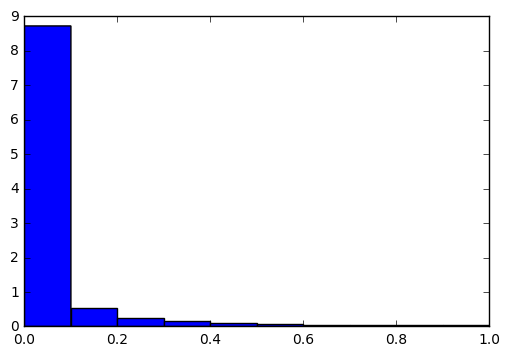

In [505]:
plt.hist(pred10x10for11[:,:,:,1].flatten(), range=(0,1), normed=True)

In [59]:
pred10x10for00 = np.zeros(shape=(nPatches,nPatches,158,2), dtype=np.float32)
j=0
for y in range(nPatches):
    i=0
    for x in range(nPatches):
        y0 = y*dxy
        y1 = y*dxy+100
        x0 = x*dxy
        x1 = x*dxy+100
        print((x0,x1,y0,y1))
        patch = slice2d[:,:, y0:y1, x0:x1]
        # patch.shape
        %time conv_ftrs = conv_model.predict(patch)
        pred = lrg_model.predict(conv_ftrs)
        print(pred.shape)
        pred10x10for00[j,i,:,:] = pred
        i+=1
    j+=1

(0, 100, 0, 100)
CPU times: user 3.61 s, sys: 14.8 ms, total: 3.63 s
Wall time: 3.63 s
(158, 2)
(45, 145, 0, 100)
CPU times: user 3.61 s, sys: 11.1 ms, total: 3.62 s
Wall time: 3.62 s
(158, 2)
(90, 190, 0, 100)
CPU times: user 3.61 s, sys: 10.9 ms, total: 3.62 s
Wall time: 3.62 s
(158, 2)
(135, 235, 0, 100)
CPU times: user 3.61 s, sys: 11.1 ms, total: 3.62 s
Wall time: 3.62 s
(158, 2)
(180, 280, 0, 100)
CPU times: user 3.61 s, sys: 10.6 ms, total: 3.62 s
Wall time: 3.63 s
(158, 2)
(225, 325, 0, 100)
CPU times: user 3.61 s, sys: 11.7 ms, total: 3.62 s
Wall time: 3.62 s
(158, 2)
(270, 370, 0, 100)
CPU times: user 3.61 s, sys: 10.7 ms, total: 3.62 s
Wall time: 3.63 s
(158, 2)
(315, 415, 0, 100)
CPU times: user 3.61 s, sys: 11.3 ms, total: 3.62 s
Wall time: 3.62 s
(158, 2)
(360, 460, 0, 100)
CPU times: user 3.6 s, sys: 10.4 ms, total: 3.61 s
Wall time: 3.62 s
(158, 2)
(405, 505, 0, 100)
CPU times: user 3.61 s, sys: 15.2 ms, total: 3.62 s
Wall time: 3.63 s
(158, 2)
(0, 100, 45, 145)
CPU tim

(array([ 8.7291,  0.4709,  0.2411,  0.143 ,  0.1025,  0.0816,  0.0633,  0.0677,  0.0424,  0.0582]),
 array([ 0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ]),
 <a list of 10 Patch objects>)

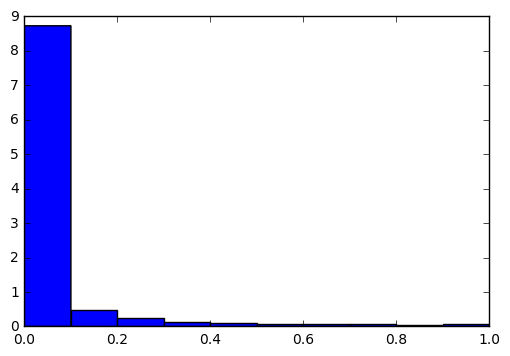

In [60]:
plt.hist(pred10x10for00[:,:,:,1].flatten(), range=(0,1), normed=True)

In [86]:
pred10x10for00.shape

(10, 10, 158, 2)

In [87]:
data_path

'/Volumes/Backups/data/kaggle2017/labeledcolorclass0/'

In [114]:
!ls -lh /Volumes/Backups/data/kaggle2017/predictions/10x10/labeledcolorclass0/

total 8
-rw-r--r--  1 rungsunan  staff     3B Apr  8 11:46 __attrs__
drwxr-xr-x  2 rungsunan  staff   102B Apr  8 11:46 data
drwxr-xr-x  2 rungsunan  staff   136B Apr  8 11:46 meta


In [118]:
!mkdir /Volumes/Backups/data/kaggle2017/predictions/10x10/labeledcolorclass1

In [95]:
save_array('/Volumes/Backups/data/kaggle2017/predictions/10x10/labeledcolorclass0', pred10x10for00)

In [ ]:
save_array

In [391]:
pred10x10for[:,:,:,1].flatten().max()

0.99998295

In [319]:
pred10x10for.shape

(10, 10, 195, 2)

In [ ]:
lrg_model.predict

In [142]:
!git add kaggle2017predictions.ipynb

In [143]:
!git commit -m "High probability (p>0.95) patches for a class 1 with (i,j,k) coordinates"

[master 7a02942] High probability (p>0.95) patches for a class 1 with (i,j,k) coordinates
 1 file changed, 435 insertions(+), 283 deletions(-)


In [144]:
!git push origin master

X11 forwarding request failed on channel 0
Counting objects: 3, done.
Delta compression using up to 4 threads.
Compressing objects: 100% (3/3), done.
Writing objects: 100% (3/3), 2.74 KiB | 0 bytes/s, done.
Total 3 (delta 2), reused 0 (delta 0)
remote: Resolving deltas: 100% (2/2), completed with 2 local objects.
To git@github.com:ungsur/luna16.git
   e97609b..7a02942  master -> master
